<a href="https://colab.research.google.com/github/Hayate336/Image-Image_Steganography/blob/main/Image_Image_Steganography.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [82]:
import cv2
import numpy as np
import random

from skimage.metrics import structural_similarity as ssim
from google.colab.patches import cv2_imshow
from google.colab import files

In [7]:
uploaded = files.upload()

Saving bleach.jpeg to bleach.jpeg
Saving Naruto.jpeg to Naruto.jpeg


In [29]:
font = cv2.FONT_HERSHEY_SIMPLEX
font_size = 2
font_thickness = 8
x,y = 150,150

Steganographed Image Verification
0.9785795519464382
 
 


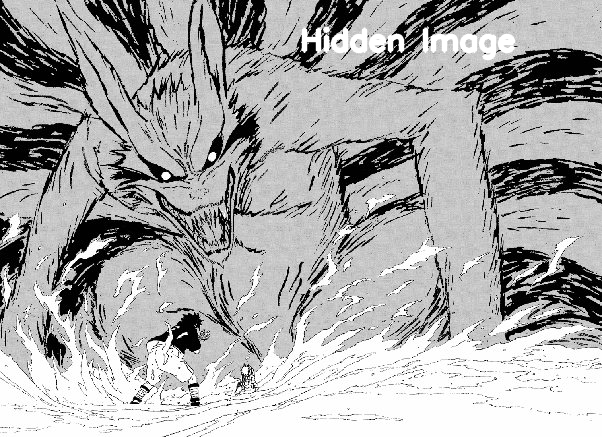

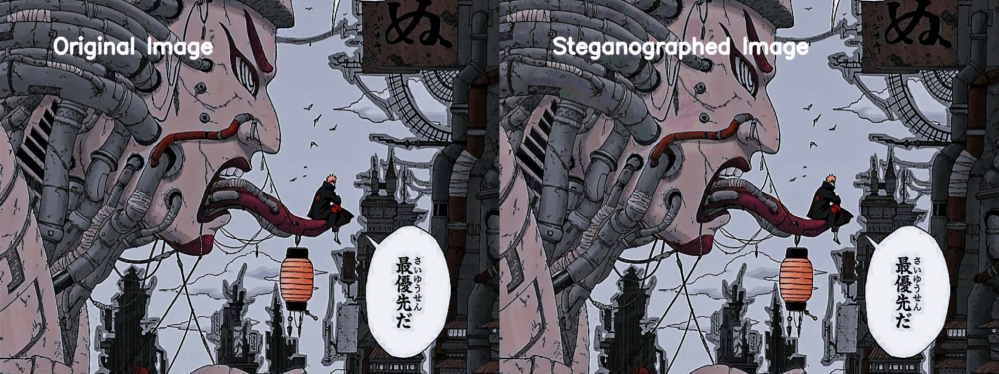

In [88]:
I = cv2.imread('Pain.jpg')
HI = cv2.imread('Naruto.jpeg')
S = I.copy()

for i in range(HI.shape[0]):
  for j in range(HI.shape[1]):
    for l in range(3):
      v1 = format(S[i][j][l], '08b')
      v2 = format(HI[i][j][l], '08b')
      v3 = v1[:4] + v2[:4]
      S[i][j][l]= int(v3, 2)

Stego = S.copy()
print("Steganographed Image Verification")
print(ssim(Stego,I,channel_axis=-1))
print(" ")
print(" ")

I = cv2.putText(I,'Original Image', (x,y), font, font_size, (255,255,255), font_thickness, cv2.LINE_AA)
HI = cv2.putText(HI,'Hidden Image', (x+150,y-100), font, font_size-1, (255,255,255), font_thickness-5, cv2.LINE_AA)
S = cv2.putText(S,'Steganographed Image', (x,y), font, font_size, (255,255,255), font_thickness, cv2.LINE_AA)

H = np.concatenate((I,S), axis=1)
cv2_imshow(HI)
cv2_imshow(H)

Original Image Verification
0.7360042451751379
 
 
Original Hidden Image Verification
0.8490056910153362
 
 


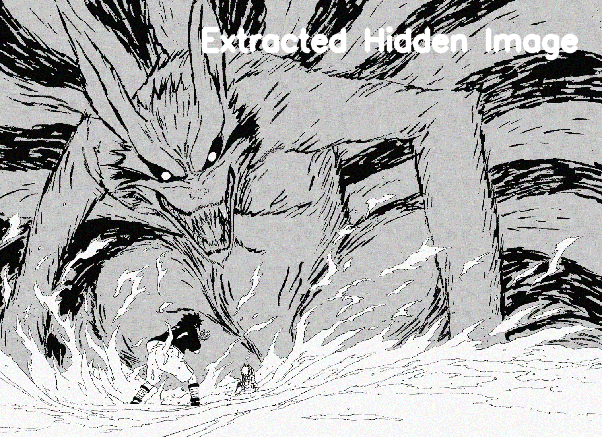

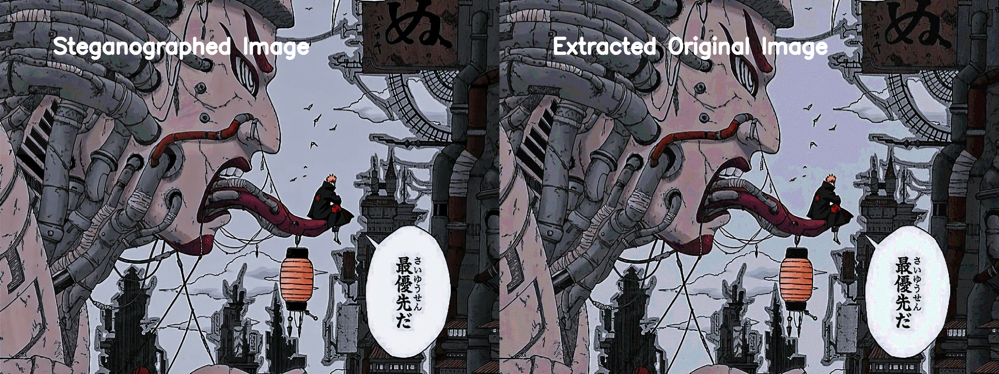

In [89]:
S = Stego.copy()
width = S.shape[0]
height = S.shape[1]

EHIW = HI.shape[0]
EHIH = HI.shape[1]

EI = np.zeros((width, height, 3), np.uint8)
EHI = np.zeros((EHIW, EHIH, 3), np.uint8)

for i in range(width):
  for j in range(height):
    for l in range(3):
      v1 = format(S[i][j][l], '08b')

      if(i < EHIW and j < EHIH):
        v3 = v1[4:] + chr(random.randint(0, 1)+48) * 4
        EHI[i][j][l]= int(v3, 2)

      v2 = v1[:4] + chr(random.randint(0, 1)+48) * 4
      EI[i][j][l]= int(v2, 2)

print("Original Image Verification")
print(ssim(EI,I,channel_axis=-1))
print(" ")
print(" ")

print("Original Hidden Image Verification")
print(ssim(EHI,HI,channel_axis=-1))
print(" ")
print(" ")

EI = cv2.putText(EI,'Extracted Original Image', (x,y), font, font_size, (255,255,255), font_thickness, cv2.LINE_AA)
EHI = cv2.putText(EHI,'Extracted Hidden Image', (x+50,y-100), font, font_size-1, (255,255,255), font_thickness-5, cv2.LINE_AA)
S = cv2.putText(S,'Steganographed Image', (x,y), font, font_size, (255,255,255), font_thickness, cv2.LINE_AA)

H = np.concatenate((S,EI), axis=1)
cv2_imshow(EHI)
cv2_imshow(H)